In [1]:
# List Of Packages - Add or remove as needed for future labs no need to change any other code
required_packages <- c("tmap", "leaflet", "leaflet.extras", "scales", "htmlwidgets", "sf", 
                       "dplyr","geojsonio","shiny","RColorBrewer","htmltools","profvis")

#Start up messages suppression
suppressPackageStartupMessages({

    # Check if the package you need is in the list and install if so
    for (package in required_packages) {
        # Checks if the package you want is already installed or not, if true then dont return any annoying messages
      if (!requireNamespace(package, quietly = TRUE)) {
        # Catch any annoying error or warning messages
        tryCatch({
            # Generic code we used to use for loading packages
          install.packages(package)
          library(package, character.only = TRUE)
        }, error = function(e) {
            #part of the try catch 
          cat("Error installing or loading package:", package, "\n")
        })
      } else {
        library(package, character.only = TRUE)
      }
    }
    
})
# Returns only this line of code once all are installed
cat("All required packages are loaded.\n")

All required packages are loaded.


In [2]:
shapefile_dir <- "C:/Users/derga/Desktop/College/Year4/Visualising Data/Lab 6/IRshapefile/IRL_adm/IRL_adm"

#dsn = data name source is the path you specifed and layer is the .shp file you want sf to read into IRgeo
IRgeo <- st_read(dsn = shapefile_dir, layer = "IRL_adm1")

Reading layer `IRL_adm1' from data source 
  `C:\Users\derga\Desktop\College\Year4\Visualising Data\Lab 6\IRshapefile\IRL_adm\IRL_adm' 
  using driver `ESRI Shapefile'
Simple feature collection with 26 features and 9 fields
Geometry type: MULTIPOLYGON
Dimension:     XY
Bounding box:  xmin: -10.66305 ymin: 51.41958 xmax: -5.993611 ymax: 55.45042
Geodetic CRS:  WGS 84


In [3]:
names(IRgeo)[names(IRgeo) == "NAME_1"] <- "County"

head(IRgeo)

,ID_0,ISO,NAME_0,ID_1,County,TYPE_1,ENGTYPE_1,NL_NAME_1,VARNAME_1,geometry
,<dbl>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<MULTIPOLYGON [°]>
1,109,IRL,Ireland,1,Carlow,Administrative County,County,NA,Ceatharlach,MULTIPOLYGON (((-6.592422 5...
2,109,IRL,Ireland,2,Cavan,Administrative County,County,NA,An Cabhán,MULTIPOLYGON (((-7.275174 5...
3,109,IRL,Ireland,3,Clare,Administrative County,County,NA,An Clár,MULTIPOLYGON (((-9.045278 5...
4,109,IRL,Ireland,4,Cork,Traditional County,County,NA,Corcaigh,MULTIPOLYGON (((-10.16361 5...
5,109,IRL,Ireland,5,Donegal,Administrative County,County,NA,Dún na nGall|Tyrconnel,MULTIPOLYGON (((-7.240834 5...
6,109,IRL,Ireland,6,Dublin,Administrative County,County,NA,Baile Átha Cliath,MULTIPOLYGON (((-6.048584 5...


Map saved to C:\Users\derga\Desktop\College\Year4\Visualising Data\Lab 6\chart.png

Resolution: 3000 by 2400 pixels

Size: 10 by 8 inches (300 dpi)



,ID_0,ISO,NAME_0,ID_1,County,TYPE_1,ENGTYPE_1,NL_NAME_1,VARNAME_1,geometry,Province
,<dbl>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<MULTIPOLYGON [°]>,<chr>
1,109,IRL,Ireland,1,Carlow,Administrative County,County,NA,Ceatharlach,MULTIPOLYGON (((-6.592422 5...,Leinster
2,109,IRL,Ireland,2,Cavan,Administrative County,County,NA,An Cabhán,MULTIPOLYGON (((-7.275174 5...,Ulster
3,109,IRL,Ireland,3,Clare,Administrative County,County,NA,An Clár,MULTIPOLYGON (((-9.045278 5...,Munster
4,109,IRL,Ireland,4,Cork,Traditional County,County,NA,Corcaigh,MULTIPOLYGON (((-10.16361 5...,Munster
5,109,IRL,Ireland,5,Donegal,Administrative County,County,NA,Dún na nGall|Tyrconnel,MULTIPOLYGON (((-7.240834 5...,Ulster
6,109,IRL,Ireland,6,Dublin,Administrative County,County,NA,Baile Átha Cliath,MULTIPOLYGON (((-6.048584 5...,Leinster


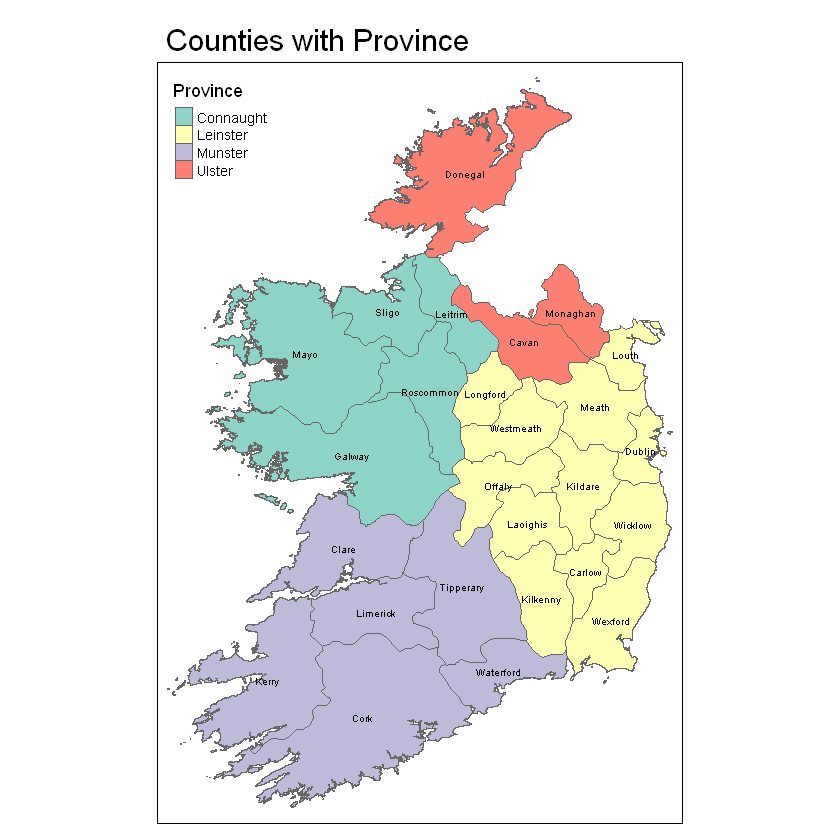

In [4]:
# For each county specified there is a corrisponding province otherwise set it s NA_character
IRgeo$Province <- sapply(IRgeo$County, switch,
  'Carlow' = 'Leinster',
  'Cavan' = 'Ulster',
  'Clare' = 'Munster',
  'Cork' = 'Munster',
  'Donegal' = 'Ulster',
  'Dublin' = 'Leinster',
  'Galway' = 'Connaught',
  'Kerry' = 'Munster',
  'Kildare' = 'Leinster',
  'Kilkenny' = 'Leinster',
  'Laoighis' = 'Leinster',
  'Leitrim' = 'Connaught',
  'Limerick' = 'Munster',
  'Longford' = 'Leinster',
  'Louth' = 'Leinster',
  'Mayo' = 'Connaught',
  'Meath' = 'Leinster',
  'Monaghan' = 'Ulster',
  'Offaly' = 'Leinster',
  'Roscommon' = 'Connaught',
  'Sligo' = 'Connaught',
  'Tipperary' = 'Munster',
  'Waterford' = 'Munster',
  'Westmeath' = 'Leinster',
  'Wexford' = 'Leinster',
  'Wicklow' = 'Leinster',
  'Other' = NA_character_
)

tm_shape(IRgeo) +
  tm_borders() +
  tm_fill("Province", title = "Province") +
  tm_text("County", size = 0.5) +
  tm_layout(main.title = "Counties with Province")

# Save the chart to your directory
tmap_save(filename = "chart.png", width = 10, height = 8)

head(IRgeo)

In [6]:
popdata <- read.csv("IRCountyPop.csv")

names(popdata)[names(popdata) == 'county'] <- 'County'

# Identify counties in popdata that are also in IRgeo
common_counties <- popdata$County %in% IRgeo$County

# Subset popdata to keep only the common counties
popdata_common <- popdata[common_counties, ]

# Change the spelling of "Laoighis" to "Laois" in IRgeo
IRgeo$County[IRgeo$County == "Laoighis"] <- "Laois"

IRgeo <- IRgeo[order(IRgeo$County), ]
popdata_common <- popdata_common[order(popdata_common$County), ]

are_identical <- identical(IRgeo$County, popdata_common$County)
if (!are_identical) {
  print("The datasets are not identical.")
  print(unique(IRgeo$County))
  print(unique(popdata$County))
} else {
  print("The datasets are identical.")
}

IRmap <- merge(IRgeo, popdata_common, by = "County")


[1] "The datasets are identical."


In [7]:
map_list <- list()

tm_1841 <- tm_shape(IRmap) +
  tm_borders() +
  tm_fill("pop1841", title = "Population in 1841", palette = "Blues") +
  tm_text("County", size = 0.5) +
  tm_layout(main.title = "Population Distribution in 1841")

tmap_save(tm_1841, filename = "population_map_1841.png")

tm_1871 <- tm_shape(IRmap) +
tm_borders() +
tm_fill("pop1871", title = "Population in 1871", palette = "Greens") +
tm_text("County", size = 0.5) +
tm_layout(main.title = "Population Distribution in 1871")

tmap_save(tm_1871, filename = "population_map_1871.png")

tm_2001 <- tm_shape(IRmap) +
  tm_borders() +
  tm_fill("pop2001", title = "Population in 2001", palette = "Reds") +
  tm_text("County", size = 0.5) +
  tm_layout(main.title = "Population Distribution in 2001")

tmap_save(tm_2001, filename = "population_map_2001.png")

Map saved to C:\Users\derga\Desktop\College\Year4\Visualising Data\Lab 6\population_map_1841.png

Resolution: 1744.539 by 2527.888 pixels

Size: 5.81513 by 8.426294 inches (300 dpi)

Map saved to C:\Users\derga\Desktop\College\Year4\Visualising Data\Lab 6\population_map_1871.png

Resolution: 1744.539 by 2527.888 pixels

Size: 5.81513 by 8.426294 inches (300 dpi)

Map saved to C:\Users\derga\Desktop\College\Year4\Visualising Data\Lab 6\population_map_2001.png

Resolution: 1744.539 by 2527.888 pixels

Size: 5.81513 by 8.426294 inches (300 dpi)



In [13]:
shinyApp(
    #Loads the year slider on top
  ui = fluidPage(
    sliderInput("year", "Select Year", min = 1841, max = 1881, step = 10, value = 1841),
      #Addes placeholder for the map to be rendered
    leafletOutput("map"),
    actionButton("stopButton", "Stop App")
  ),
  server = function(input, output, session) {
    #Computes a subset of IRmap depending on the year chosen
    filtered_data <- reactive({
      year <- paste("pop", input$year, sep = "")
      IRmap_subset <- IRmap[, c("County", year)]
      names(IRmap_subset)[2] <- "Population"
      return(IRmap_subset)
    })
    #Renders the leaflet map
    output$map <- renderLeaflet({
        #A color palette is defined using the "YlOrRd" palette and 8 quantiles based on the population data
      pal <- colorQuantile(palette = "YlOrRd", n = 8, domain = range(filtered_data()$Population))
        #Makes sure the legend is broken down from min to max populations
      breaks <- seq(from = min(filtered_data()$Population), to = max(filtered_data()$Population), length.out = 9)
      
      leaflet() %>%
        #Sets the background map tiles
        addProviderTiles(provider = "CartoDB.Positron") %>%
        # Adds counties to the map, filling them with colors based on population and showing county information in a popup.
        addPolygons(
          data = IRmap,
          fillColor = ~pal(filtered_data()$Population),
          fillOpacity = 0.7,
          color = "white",
          weight = 1,
            #pop up mentioned earlier
          popup = paste("<strong>County:</strong> ", IRmap$County, "<br>",
                        "<strong>Population ", input$year, ":</strong> ", filtered_data()$Population)
        ) %>%
        #the legend to show the years using the seq() in break mentioned earlier
        addLegend(
          pal = pal,
          values = breaks,
          title = paste("Population in", input$year),
          position = "bottomright"
        )
    })
    
    observeEvent(input$stopButton, {
        #an acction bar to stop the shiny server that is listening, other wise kernel will be busy
      stopApp()
    })
  }
)



Listening on http://127.0.0.1:4953

